<a href="https://colab.research.google.com/github/theaok/gisPy/blob/main/folium.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**interactive fun fun**: an actual map on its own can open in webbrowser :)

folium (and leafmap) are like google maps with stuff on it--great for:

-mapping at low level like neighborhoods, blocks, streets

-sharing with others



### plotly [do at home]

https://plotly.com/python/choropleth-maps/

its kinda in between gpd and folium/leafmap--more clickable and interactive than gpd, yet not using fully fledged online map interface like folium/leafmap


### [nov2] folium

its been around for some time; stable; i had no issues

see

https://geopandas.org/en/stable/gallery/plotting_with_folium.html

https://geopandas.org/en/stable/gallery/polygon_plotting_with_folium.html

https://python-visualization.github.io/folium/latest/user_guide.html

In [3]:
import time, webbrowser

import pandas as pd
import geopandas as gpd

from google.colab import data_table
data_table.enable_dataframe_formatter()

from geopandas.tools import geocode
#! pip install geocoder
from geopy.geocoders import Nominatim

geolocator = Nominatim(user_agent='blah@gmail.com')


import folium as f
from folium.plugins import MarkerCluster, HeatMap

#will display all output not just last command
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

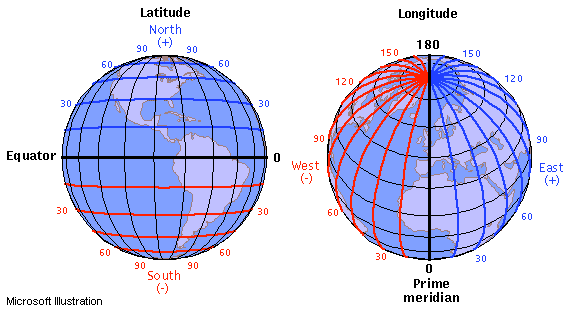

In [8]:
#note can put lat and long into google maps too
#m=
f.Map(location=[40, -75]) #open street map is default
#m.save('m.html')
#webbrowser.get('firefox').open_new_tab('m.html') #; webbrowser.open('m.html')

False

In [4]:
location = geolocator.geocode("401 cooper st camden nj")
location.address

'401, Cooper Street, Downtown, Camden, Camden County, New Jersey, 08102, United States'

In [ ]:
(location.latitude, location.longitude)

(39.947189, -75.121843)

In [ ]:
location[1]

(39.947189, -75.121843)

In [ ]:
f.Map(location=location[1])

In [ ]:
f.Map(location=location[1], tiles='Cartodb Positron', zoom_start=16)
'''
Cartodb Positron
Cartodb dark_matter
https://leaflet-extras.github.io/leaflet-providers/preview/
Stamen as of oct2023 gives warning wont be supported:
Stamen Toner
Stamen Terrain
'''

'\nCartodb Positron\nCartodb dark_matter\nhttps://leaflet-extras.github.io/leaflet-providers/preview/\nStamen as of oct2023 gives warning wont be supported:\nStamen Toner\nStamen Terrain\n'

In [ ]:
f.Map(location=location[1], tiles='Cartodb dark_matter', zoom_start=6)

In [5]:
###adding markup by hand--easy! good for few u/a
m = f.Map(location=geolocator.geocode("401 cooper st, Camden nj")[1], zoom_start=14)
#time.sleep(1)
m.add_child(f.Marker(geolocator.geocode("401 cooper st, Camden nj")[1], popup='DPPA'))
m.add_child(f.Marker(geolocator.geocode("321 cooper st, Camden nj")[1], popup='bbb'))
m.add_child(f.CircleMarker(geolocator.geocode("waterfront camden nj")[1], popup='waterfront'))
#more cool options https://python-visualization.github.io/folium/latest/user_guide/vector_layers/circle_and_circle_marker.html
m.save('m.html') #and click on the left folder icon and download and open in webbrowser

In [ ]:
'''can pick color, icon
icons: http://www.w3schools.com/icons/bootstrap_icons_glyphicons.asp
colors: http://www.w3schools.com/colors/colors_names.asp
'''
m = f.Map(location=geolocator.geocode("401 cooper st camden nj")[1], zoom_start=14)
m.add_child(f.Marker(geolocator.geocode("401 cooper st camden nj")[1],
                     popup='i love this place!',icon = f.Icon(icon = 'cloud' ,color = 'green')))
m.add_child(f.CircleMarker(geolocator.geocode("2 Riverside Dr, Camden, NJ 08103")[1], popup='waterfront'
,color='#8A2BE2',fill_color='#F0F8FF'))
#m.save('m8.html')

'can pick color, icon\nicons: http://www.w3schools.com/icons/bootstrap_icons_glyphicons.asp\ncolors: http://www.w3schools.com/colors/colors_names.asp\n'

#### many points

In [ ]:
aptPhi0=pd.read_excel('https://github.com/theaok/data/raw/main/apartments-for-rent.xls')
aptPhi0.head(3)
aptPhi0.columns

,Philadelphia Apartments,Property Overview,Phone Number,Address,City,State,Zip,Neighborhood,Map,Efficiency/Studios,...,Access Gates,Furnished,Cable-Ready,Short-term Available,Cats Allowed,Small Dogs Allowed,Large Dogs Allowed,Pets Negotiable,Wheelchair Accessible,URL
0,The Granary,All Floorplans,(215) 716-1675,1901 Callowhill St,Philadelphia,PA,19130,NaN,Map It,1,...,,,Yes,,,,,,,http://www.apartmenthomeliving.com/apartment-f...
1,Beacon Pointe Luxury Apartments,All Floorplans,(844) 627-2575,9503 State Rd,Philadelphia,PA,19114,NaN,Map It,1000,...,Yes,,Yes,,Yes,,,,,http://www.apartmenthomeliving.com/apartment-f...
2,Chestnut Hall Apartments,All Floorplans,(888) 775-4524,3900 Chestnut St,Philadelphia,PA,19104,NaN,Map It,1015,...,,,,,,,,,,http://www.apartmenthomeliving.com/apartment-f...


Index(['Philadelphia Apartments', 'Property Overview', 'Phone Number',
       'Address', 'City', 'State', 'Zip', 'Neighborhood', 'Map',
       'Efficiency/Studios', '1 Bedroom', '2 Bedroom', '3 Bedroom',
       '4 Bedroom', 'Lofts', 'Townhomes', 'Allows Pets', 'Air Conditioning',
       'Fitness Center', 'Parking', 'Pool(s)', 'Onsite Laundry',
       'Washer/Dryer in Unit', 'Washer/Dryer Hookups', 'Walk-in Closet',
       'Hardwood Floors', 'Wireless Internet', 'Garage', 'Access Gates',
       'Furnished', 'Cable-Ready', 'Short-term Available', 'Cats Allowed',
       'Small Dogs Allowed', 'Large Dogs Allowed', 'Pets Negotiable',
       'Wheelchair Accessible', 'URL'],
      dtype='object')

In [ ]:
aptPhi=aptPhi0.loc[0:5, ['Philadelphia Apartments','Address','City','State','Zip','1 Bedroom']] #just subset to 5 for faster geocoding
aptPhi

,Philadelphia Apartments,Address,City,State,Zip,1 Bedroom
0,The Granary,1901 Callowhill St,Philadelphia,PA,19130,1925
1,Beacon Pointe Luxury Apartments,9503 State Rd,Philadelphia,PA,19114,1185
2,Chestnut Hall Apartments,3900 Chestnut St,Philadelphia,PA,19104,1325
3,Vernon House,3226 Clifford St,Philadelphia,PA,19121,469
4,Walnut Terrace,401 W Walnut Ln,Philadelphia,PA,19144,740
5,NPDF - The Cornerstone,400 S 48th St,Philadelphia,PA,19143,700


In [ ]:
aptPhi['combined'] = aptPhi[['Address','City','State','Zip']].apply(lambda row: ' '.join(row.values.astype(str)), axis=1)
aptPhi

,Philadelphia Apartments,Address,City,State,Zip,1 Bedroom,combined
0,The Granary,1901 Callowhill St,Philadelphia,PA,19130,1925,1901 Callowhill St Philadelphia PA 19130
1,Beacon Pointe Luxury Apartments,9503 State Rd,Philadelphia,PA,19114,1185,9503 State Rd Philadelphia PA 19114
2,Chestnut Hall Apartments,3900 Chestnut St,Philadelphia,PA,19104,1325,3900 Chestnut St Philadelphia PA 19104
3,Vernon House,3226 Clifford St,Philadelphia,PA,19121,469,3226 Clifford St Philadelphia PA 19121
4,Walnut Terrace,401 W Walnut Ln,Philadelphia,PA,19144,740,401 W Walnut Ln Philadelphia PA 19144
5,NPDF - The Cornerstone,400 S 48th St,Philadelphia,PA,19143,700,400 S 48th St Philadelphia PA 19143


In [ ]:
#playing around to figure things out
#geolocator.geocode(aptPhi['combined'][0])[1]
#for i in aptPhi.index:
#  print(i)

m = f.Map(location=geolocator.geocode("philadelphia")[1], zoom_start=14)
for i in aptPhi.index:
  m.add_child(f.Marker(geolocator.geocode(aptPhi['combined'][i])[1], popup='1brm price: '+ aptPhi['1 Bedroom'][i].astype(str)))

##### [*] more convoluted way

turn to gpd, then list of lists and then map that with add_children

In [ ]:
aptPhi[['geometry','addrNom']] = geocode(aptPhi['combined'], provider='nominatim', user_agent='blah@gmail.com',timeout=2)

In [ ]:
aptPhi.head(2)

,Philadelphia Apartments,Address,City,State,Zip,1 Bedroom,combined,geometry,addrNom
0,The Granary,1901 Callowhill St,Philadelphia,PA,19130,1925,1901 Callowhill St Philadelphia PA 19130,POINT (-75.17069 39.96038),"1901, Callowhill Street, Center City, Philadel..."
1,Beacon Pointe Luxury Apartments,9503 State Rd,Philadelphia,PA,19114,1185,9503 State Rd Philadelphia PA 19114,POINT (-74.98335 40.04907),"Beacon Pointe, 9503, State Road, Delaire Landi..."


In [ ]:
gdf = gpd.GeoDataFrame(aptPhi, geometry='geometry') #, crs="EPSG:4326"
gdf.get_coordinates()
#gdf.plot()

,x,y
0,-75.170686,39.960382
1,-74.983350,40.049070
2,-75.200204,39.955214
3,-75.187552,39.983113
4,-75.188564,40.032797
5,-75.213107,39.943414


In [ ]:
lolR=gdf.get_coordinates().values.tolist()
#lolR
lol=[li[::-1] for li in lolR] #inverse elements in list

In [ ]:
m = f.Map(location=geolocator.geocode("philadelphia")[1], zoom_start=14)
m.add_children(MarkerCluster(locations=lol))
#m

<ipython-input-117-05ff4766ecf1>:2: FutureWarning: Method `add_children` is deprecated. Please use `add_child` instead.
  m.add_children(MarkerCluster(locations=lol))


#### marker clusterer, heatmap

many points, clustering, USEFUL! fancy!

http://blog.dominodatalab.com/creating-interactive-crime-maps-with-folium/

In [ ]:
!wget -q -O sfCrim.csv  https://raw.githubusercontent.com/devanshmanu/StravAdd/master/SFPD_Incidents_-_Current_Year__2015_.csv

sfCrim = pd.read_csv('sfCrim.csv')
len(sfCrim)

#sfCrim[1:3]
sfCrim=sfCrim[0:1000] #for speed purposes

112331

In [ ]:
#create empty map zoomed in on San Francisco
m = f.Map(location=(37.76, -122.45), zoom_start=12)

loc = []
#add a marker for every record in the filtered data
for each in sfCrim.iterrows():
    loc.append([each[1]['Y'],each[1]['X']])

loc[1:3]

m.add_children(MarkerCluster(locations=loc)) #use a clustered view
#m.save('m10.html')
#very cool! hover over it--pups u in blue a polygon that the aggregate refers to!

[[37.7126165766239, -122.413676487435], [37.7126165766239, -122.413676487435]]

<ipython-input-147-8c743082f7b2>:11: FutureWarning: Method `add_children` is deprecated. Please use `add_child` instead.
  m.add_children(MarkerCluster(locations=loc)) #use a clustered view


In [ ]:
#now with crim popup
sanfran_map = f.Map(location = [37.76, -122.45], zoom_start = 12)

# instantiate a mark cluster object for the incidents in the dataframe
incidents = MarkerCluster().add_to(sanfran_map)

# loop through the dataframe and add each data point to the mark cluster
for lat, lng, label, in zip(sfCrim.Y, sfCrim.X, sfCrim.Category):
    f.Marker(
        location=[lat, lng],
        icon=None,
        popup=label,
    ).add_to(incidents)

# display map
sanfran_map

In [ ]:
### heatmap http://www.jackboot7.com/visualizing-tweets.html
m = f.Map(location=(37.76, -122.45), zoom_start=12)
m.add_children(HeatMap(loc))

<ipython-input-148-31a4eff0c30e>:3: FutureWarning: Method `add_children` is deprecated. Please use `add_child` instead.
  m.add_children(HeatMap(loc))


#### [nov2] polygons

folium works with geojson, can google for it just like you did with shapefiles, or gpd can save as geojson

https://geopandas.org/en/stable/docs/reference/api/geopandas.GeoDataFrame.to_json.html


In [ ]:
#adding geojson
map = f.Map()
map
f.GeoJson('https://raw.githubusercontent.com/datasets/geo-admin1-us/master/data/admin1-us.geojson').add_to(map)
map

In [ ]:
url = (
    "https://raw.githubusercontent.com/python-visualization/folium/master/examples/data"
)
state_geo = f"{url}/us-states.json"
state_unemployment = f"{url}/US_Unemployment_Oct2012.csv"
state_data = pd.read_csv(state_unemployment)

In [ ]:
states = gpd.read_file(state_geo)
print(states.head())

   id        name                                           geometry
0  AL     Alabama  POLYGON ((-87.35930 35.00118, -85.60667 34.984...
1  AK      Alaska  MULTIPOLYGON (((-131.60202 55.11798, -131.5691...
2  AZ     Arizona  POLYGON ((-109.04250 37.00026, -109.04798 31.3...
3  AR    Arkansas  POLYGON ((-94.47384 36.50186, -90.15254 36.496...
4  CA  California  POLYGON ((-123.23326 42.00619, -122.37885 42.0...


In [ ]:
state_data.head(50)

,State,Unemployment
0,AL,7.1
1,AK,6.8
2,AZ,8.1
3,AR,7.2
4,CA,10.1
5,CO,7.7
6,CT,8.4
7,DE,7.1
8,FL,8.2
9,GA,8.8


In [ ]:
m = f.Map(location=[40, -95], zoom_start=4)
m

In [ ]:
f.Choropleth(
    geo_data=state_geo, #geo data obj: state_geo
    name="choropleth",
    data=state_data,   #regular data object
    columns=["State", "Unemployment"], # 1st var is join or merge var; 2nd is map var
    #KLUDGE: may not merge! first do a dry run to make sure everything merges fine: see next example!
    key_on="feature.id",  #this is merge/join var from geojson; just prefix ith 'feature
    fill_color="YlGnBu", #pick some color, opacities
    fill_opacity=0.7,
    line_opacity=.1,
    legend_name="Unemployment Rate (%)",
).add_to(m)

f.LayerControl().add_to(m)

m
#m.save('m2.html')

#### ex: countries eco footprint
elaboration: https://realpython.com/python-folium-web-maps-from-data/

In [ ]:
#https://en.wikipedia.org/wiki/List_of_countries_by_ecological_footprint
pd.read_html('https://en.wikipedia.org/wiki/List_of_countries_by_ecological_footprint',match='Biocapacity',flavor=None)[0].head(3)

,Rank,Country/region,Ecological footprint,Biocapacity,Biocapacity deficit or reserve,Population (millions),Total biocapacity deficit or reserve (gMha),Population (millions) for biocapacity to equal ecological footprint*
,Rank,Country/region,(gha/person),(gha/person),(gha/person),Population (millions),Total biocapacity deficit or reserve (gMha),Population (millions) for biocapacity to equal ecological footprint*
0,NaN,World,2.75,1.63,-1.12,7753.00,-10400,2500.000000
1,1.0,Luxembourg,15.82,1.68,−14.14,0.63,−7.35,0.055221
2,2.0,Aruba,11.88,0.57,−11.31,0.17,−1.13,0.004798


In [ ]:
eco_footprints=pd.read_html('https://en.wikipedia.org/wiki/List_of_countries_by_ecological_footprint',match='Biocapacity',flavor=None)[0]
eco_footprints['ecoFoo']=eco_footprints['Ecological footprint'].astype(float)
eco_footprints.columns = eco_footprints.columns.get_level_values(0)
eco_footprints

,Rank,Country/region,Ecological footprint,Biocapacity,Biocapacity deficit or reserve,Population (millions),Total biocapacity deficit or reserve (gMha),Population (millions) for biocapacity to equal ecological footprint*,ecoFoo
0,NaN,World,2.75,1.63,-1.12,7753.00,-10400,2500.000000,2.75
1,1.0,Luxembourg,15.82,1.68,−14.14,0.63,−7.35,0.055221,15.82
2,2.0,Aruba,11.88,0.57,−11.31,0.17,−1.13,0.004798,11.88
3,3.0,Qatar,10.80,1.24,−9.56,2.05,−19.60,0.235373,10.80
4,4.0,Australia,9.31,16.57,7.26,23.05,167.34,41.024540,9.31
...,...,...,...,...,...,...,...,...,...
185,184.0,Pakistan,0.79,0.35,−0.44,179.16,−78.83,79.374680,0.79
186,185.0,Bangladesh,0.72,0.38,−0.35,154.70,−54.15,81.647220,0.72
187,186.0,Haiti,0.61,0.27,−0.34,10.17,−3.46,4.501475,0.61
188,187.0,Timor-Leste,0.48,1.78,1.3,1.11,1.44,4.116250,0.48


In [ ]:
political_countries_url = (

    "http://geojson.xyz/naturalearth-3.3.0/ne_50m_admin_0_countries.geojson"

)


m = f.Map(location=(30, 10), zoom_start=3, tiles="cartodb positron")

f.GeoJson(political_countries_url).add_to(m)
#m.save("footprint.html")
m

In [ ]:
! wget -q -O a.geojson 'http://geojson.xyz/naturalearth-3.3.0/ne_50m_admin_0_countries.geojson'
#! cat a.geojson
a=gpd.read_file('a.geojson') #.head(3)

In [ ]:
b=pd.merge(a,eco_footprints,left_on='admin',right_on='Country/region',indicator=True)
b._merge.value_counts() #yay

both          175
left_only       0
right_only      0
Name: _merge, dtype: int64

In [ ]:
m = f.Map(location=(30, 10), zoom_start=3, tiles="cartodb positron")

max_eco_footprint = eco_footprints["Ecological footprint"].max()

f.Choropleth(

    geo_data=political_countries_url,

    data=eco_footprints,

    columns=["Country/region", "ecoFoo"],

    key_on="feature.properties.admin",

    fill_color="RdYlGn_r",

    fill_opacity=0.8,

    line_opacity=0.3,

    nan_fill_color="white",

    legend_name="Ecological footprint per capita",

    bins=[0, 1, 1.5, 2, 3, 4, 5, 6, 7, 8, max_eco_footprint], #or can do jenks-breaks: https://vialab.mit.edu/tutorials/module/mapping-in-python-folium/

).add_to(m)

m

#### other examples

animated: covid in india, bus in nyc etc https://www.analyticsvidhya.com/blog/2020/06/guide-geospatial-analysis-folium-python/

#### draw

useful to create your own data :)

In [ ]:
from folium.plugins import Draw

m = f.Map()

Draw(export=True).add_to(m)

#hit export button in the map below to export (it downloads on your local hd)
m #before adding too much, make sure it exports and loads back ok;
  #eg i had issue with stuff (eg circle) didnt display--it may be mixing points with lines and polygons
  #better have one type only and export each as separate layer

In [ ]:
#then click folder icon on the left and upload data.geojson from local hd
map = f.Map()
f.GeoJson('data(3).geojson').add_to(map)
map

can also draw in https://www.google.com/maps/d/
lets check it out!

#### other plugins

In [ ]:
#fullscreen :0 actually very neat
m = f.Map(location=[41.9, -97.3], zoom_start=4)

f.plugins.Fullscreen(
    position="topright",
    title="Expand me",
    title_cancel="Exit me",
    force_separate_button=True,
).add_to(m)

m

and there's more--check out:
https://python-visualization.github.io/folium/latest/user_guide/plugins.html

### leafmap

just skim through quickly like 15min

we list it as 2nd to leaflet as it does require more dependencies; also may be more buggy

lots of great functionality; easy to use

also interactive! almost like full blown gis soft like qgis: eg click on the right the toolbox and can do a ton of stuff incl open attr table etc (may need additional libraries like ipysheet)

In [ ]:
!pip install leafmap
!pip install pycrs
!pip install osmnx
!pip install mapclassify

In [ ]:
#ton of dependencies; also saying here which for what not to get lost
import leafmap
import pycrs #may be needed for some imported data such as shapefiles
import geopandas #may be needed to for some files such a kml
import osmnx #for geocoding, eg we geocode camden
import mapclassify #for thematic maps

In [ ]:
#leafmap.basemaps.keys() #ton of possible basemaps

In [ ]:
m = leafmap.Map(
    #google_map="ROADMAP", # ROADMAP HYBRID #change basemap
    center=(40, -100), zoom=4, height="400px", width="800px",
    #draw_control=False, #turn off controls
    #measure_control=False,
    #fullscreen_control=False,
    #attribution_control=True,
    )
#m.to_html("mymap.html")
m

Map(center=[40, -100], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_t…

In [ ]:
#add geojson
m = leafmap.Map(center=[0, 0], zoom=2)
cou = "https://raw.githubusercontent.com/giswqs/leafmap/master/examples/data/countries.geojson"
cab = 'https://raw.githubusercontent.com/giswqs/leafmap/master/examples/data/cable_geo.geojson'
style = {
    "stroke": True,
    "color": "#0000ff",
    "weight": 2,
    "opacity": 1,
    "fill": True,
    "fillColor": "#0000ff",
    "fillOpacity": 0.1,
}
hover_style = {"fillOpacity": 0.7}
m.add_geojson(cou, layer_name="Countries", style=style, hover_style=hover_style)
m.add_geojson(cab, layer_name="Cable lines")
m

Map(center=[0, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text'…

In [ ]:
#add shapefile
m = leafmap.Map(center=[0, 0], zoom=2)
in_shp = 'https://github.com/giswqs/leafmap/raw/master/examples/data/countries.zip'
m.add_shp(in_shp, layer_name="Countries")
m


Downloading...
From: https://github.com/giswqs/leafmap/raw/master/examples/data/countries.zip
To: /tmp/countries.zip
100%|██████████| 132k/132k [00:00<00:00, 3.97MB/s]


Extracting files...


Map(center=[0, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text'…

In [ ]:
#add kml
m = leafmap.Map()
in_kml = 'https://raw.githubusercontent.com/giswqs/leafmap/master/examples/data/us_states.kml'
m.add_kml(in_kml, layer_name="US States KML")
m

Downloading...
From: https://raw.githubusercontent.com/giswqs/leafmap/master/examples/data/us_states.kml
To: /content/us_states.kml
95.4kB [00:00, 5.34MB/s]                   


Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

In [ ]:
#can add csv straightup as long as have x y
m = leafmap.Map()
df = pd.read_csv('https://raw.githubusercontent.com/giswqs/leafmap/master/examples/data/us_cities.csv') #pandas
m.add_points_from_xy(df, x="longitude", y="latitude")
m
###straight from csv file:
#m = leafmap.Map()
#data = 'https://raw.githubusercontent.com/giswqs/leafmap/master/examples/data/us_cities.csv'
#m.add_points_from_xy(data, x="longitude", y="latitude")
#m

Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

In [ ]:
#heatmap
m = leafmap.Map()
in_csv = "https://raw.githubusercontent.com/giswqs/leafmap/master/examples/data/world_cities.csv"
m.add_heatmap(
    in_csv,
    latitude="latitude",
    longitude='longitude',
    value="pop_max",
    name="Heat map",
    radius=15, #play with radius to achieve desired heat
)
colors = ['blue', 'lime', 'red']
vmin = 0
vmax = 10000
m.add_colorbar(colors=colors, vmin=vmin, vmax=vmax)
m.add_title("World Population Heat Map", font_size="20px", align="center")
m

The ipyleaflet map does not support titles.


Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

In [ ]:
#thematic map
data = "https://raw.githubusercontent.com/giswqs/leafmap/master/examples/data/countries.geojson"
m = leafmap.Map()
m.add_data(
    data, column='POP_EST', scheme='Quantiles', cmap='Blues', legend_title='Population'
)
m
'''classification schemes:
BoxPlot
EqualInterval
FisherJenks
FisherJenksSampled
HeadTailBreaks
JenksCaspall
JenksCaspallForced
JenksCaspallSampled
MaxP
MaximumBreaks
NaturalBreaks
Quantiles
Percentiles
StdMean
UserDefined'''

'classification schemes:\nBoxPlot\nEqualInterval\nFisherJenks\nFisherJenksSampled\nHeadTailBreaks\nJenksCaspall\nJenksCaspallForced\nJenksCaspallSampled\nMaxP\nMaximumBreaks\nNaturalBreaks\nQuantiles\nPercentiles\nStdMean\nUserDefined'

In [ ]:
#geocode
m = leafmap.Map(toolbar_control=False, layers_control=True)
m.add_osm_from_geocode("Camden NJ", layer_name='Cam')
m

Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

In [ ]:
#add census data
for key in leafmap.get_census_dict():
    print(key)

Current
ACS 2021
ACS 2019
ACS 2018
ACS 2017
ACS 2016
ACS 2015
ACS 2014
ACS 2013
ACS 2012
ECON 2012
Census 2020
Census 2010
Physical Features
Decennial Census 2020
Decennial Census 2010
Decennial Census 2000
Decennial Physical Features


In [ ]:
census_data_dict = leafmap.get_census_dict()
census_data_dict['Census 2020']['layers']

['Alaska_Native_Regional_Corporations10465',
 'Alaska_Native_Regional_Corporations_Labels60868',
 'Alaska_Native_Village_Statistical_Areas34178',
 'Alaska_Native_Village_Statistical_Areas_Labels14319',
 'American_Indian_Joint-Use_Areas11842',
 'American_Indian_Joint-Use_Areas_Labels32943',
 'Census_Block_Groups59805',
 'Census_Block_Groups_Labels32376',
 'Census_Blocks1978',
 'Census_Blocks_Labels63431',
 'Census_Designated_Places65166',
 'Census_Designated_Places_Labels61459',
 'Census_Divisions8578',
 'Census_Divisions_Labels29679',
 'Census_Regions16659',
 'Census_Regions_Labels31526',
 'Census_Tracts7651',
 'Census_Tracts_Labels33558',
 'Combined_New_England_City_and_Town_Areas35117',
 'Combined_New_England_City_and_Town_Areas_Labels20328',
 'Combined_Statistical_Areas61231',
 'Combined_Statistical_Areas_Labels52090',
 'Consolidated_Cities65047',
 'Consolidated_Cities_Labels30018',
 'Counties',
 'Counties_Labels19364',
 'County_Subdivisions63689',
 'County_Subdivisions_Labels25452'

In [ ]:
m = leafmap.Map(zoom=5,center=[40,-90])
m.add_census_data(wms="Census 2020", layer="States")
m.add_census_data(wms="Census 2020", layer="States_Labels49388")
m
#or in toolbox click 9th icon Get US Census Data; need to zoom; and may not work (i had issues with some)

Map(center=[40, -90], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_te…

In [ ]:
#vis land cover change #hit toolbar on the right, Layers, and turn on and off 2019
m = leafmap.Map(center=[36.1, -115.2],zoom=9)
m.add_basemap('NLCD 2001 CONUS Land Cover')
m.add_basemap('NLCD 2019 CONUS Land Cover')
m.add_legend(builtin_legend='NLCD')
m

Map(center=[36.1, -115.2], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_o…

In [ ]:
#lidar WONT RUN IN COLAB, need other interpreter; or maybe other backend
#https://leafmap.org/notebooks/48_lidar/
#!pip install laspy[lazrs,laszip]
#!pip install leafmap[lidar] open3d

In [ ]:
#url = 'https://github.com/giswqs/data/raw/main/lidar/madison.zip'
#filename = 'madison.las'
#if not os.path.exists(filename):
#    leafmap.download_file(url, 'madison.zip', unzip=True)

In [ ]:
#las = leafmap.read_lidar(filename)
#las.header


In [ ]:
#leafmap.view_lidar(filename, backend='open3d', background='white')

## satelite img

folium is just one library

there are others, eg can get sat img straight to python, kind of similar like these APIs to Fed and World Bank we did earlier; eg check out these links:

https://carpentries-incubator.github.io/geospatial-python/05-access-data/

https://sites.northwestern.edu/researchcomputing/2021/11/19/downloading-satellite-images-made-easy/